In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
from os import listdir

In [7]:
px.set_mapbox_access_token("pk.eyJ1Ijoicm1jbnJpYmVpcm8iLCJhIjoiY2s4MHh5b3ZiMGtsbTNkcGFuazR1dWc4diJ9._aDTNPlmw3Nt6QSMm3YgmQ")

In [8]:
!git pull

Already up to date.


In [25]:
all_data = pd.DataFrame()
for f in listdir('data/'):
    x = pd.read_csv('data/'+ f)
    x = x.drop(['Unnamed: 0'], axis=1)
    x.to_csv('data/'+ f+'x', index=False)
    #all_data = all_data.append(pd.read_csv('data/'+ f), sort=False)
    x.head()


KeyError: "['Unnamed: 0'] not found in axis"

In [19]:
all_data.drop([all_data.columns[5]], axis=1)

,DATAHORA,LATITUDE,LINHA,LONGITUDE,ORDEM,VELOCIDADE
0,2020-04-05 00:21:11,-22.88343,2310.0,-43.49518,D53924,0.0
1,2020-04-05 00:47:24,-22.89432,0.0,-43.53513,86861.0,38.0
2,2020-04-05 01:08:24,-22.89382,0.0,-43.53192,86803.0,0.0
3,2020-04-05 01:14:41,-22.89658,2383.0,-43.56108,D12124,1.0
4,2020-04-05 02:03:24,-22.86833,473.0,-43.29293,A29125,0.0
5,2020-04-05 02:09:54,-22.89413,866.0,-43.53321,D86059,0.0
6,2020-04-05 03:16:32,-22.81485,326.0,-43.18853,B28546,0.0
7,2020-04-05 03:34:40,-22.89978,0.0,-43.54255,86878.0,54.0
8,2020-04-05 03:49:43,-22.95279,881.0,-43.35028,C47775,0.0
9,2020-04-05 04:02:10,-22.87480,111.0,-43.24092,A41016,0.0


In [33]:
print(all_data.shape)
all_data = all_data[all_data.LONGITUDE>-44]
all_data = all_data[all_data.LONGITUDE<-43]
all_data = all_data[all_data.LATITUDE>-23.06]
all_data = all_data[all_data.LATITUDE<-22]
all_data = all_data.dropna()
print(all_data.shape)

(1027988, 6)
(1021270, 6)


In [34]:
data_474 = all_data[all_data['LINHA']=='474.0'].sort_values(['ORDEM','DATAHORA'])
data_474

,DATAHORA,ORDEM,LINHA,LATITUDE,LONGITUDE,VELOCIDADE
1761,2020-04-05 14:19:00,A29009,474.0,-22.98627,-43.19000,0.0
3461,2020-04-05 14:21:02,A29009,474.0,-22.98087,-43.19117,20.0
5118,2020-04-05 14:23:02,A29009,474.0,-22.97301,-43.18824,9.0
6509,2020-04-05 14:24:32,A29009,474.0,-22.97035,-43.18602,39.0
8424,2020-04-05 14:27:32,A29009,474.0,-22.96569,-43.17773,28.0
9971,2020-04-05 14:29:02,A29009,474.0,-22.96438,-43.17490,36.0
11430,2020-04-05 14:30:14,A29009,474.0,-22.95786,-43.17707,51.0
13659,2020-04-05 14:33:14,A29009,474.0,-22.95007,-43.17739,34.0
14916,2020-04-05 14:35:14,A29009,474.0,-22.94491,-43.18214,41.0
16560,2020-04-05 14:37:14,A29009,474.0,-22.93354,-43.18439,21.0


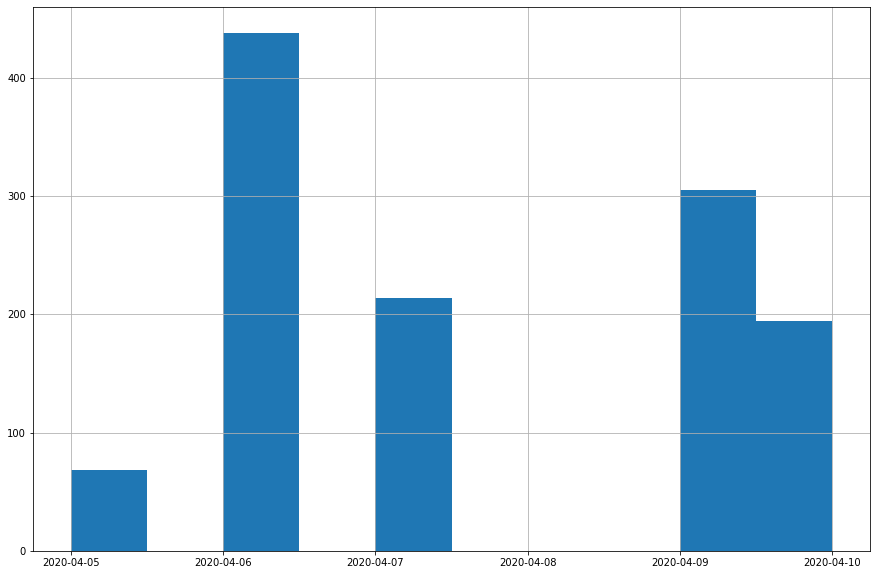

In [35]:
data_474['DATAHORA'].dt.date.hist(figsize=(15,10))

In [37]:
fig = px.scatter_mapbox(data_474, lat="LATITUDE", lon="LONGITUDE", color="LINHA", hover_data=["LINHA", "ORDEM"], zoom=12)
fig.update_layout(mapbox_style="dark")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [15]:
def get_coord(df,ordem,data):
    df = df[df['ORDEM'] == ordem]
    antes = df[df['DATAHORA']<data].sort_values('DATAHORA').tail(1)
    depois = df[df['DATAHORA']>=data].sort_values('DATAHORA').head(1)
    return pd.concat([antes,depois])
get_coord(all_data, 'A29191', '2020-04-07 15:33:05')

,DATAHORA,ORDEM,LINHA,LATITUDE,LONGITUDE,VELOCIDADE
272533,2020-04-07 15:32:35,A29191,SV474,-22.91663,-43.19437,15.0
272908,2020-04-07 15:33:05,A29191,474.0,-22.91928,-43.19451,47.0


In [16]:
max_lat, min_lat,  max_long, min_long = (all_data.LATITUDE.max(),all_data.LATITUDE.min(),
                                        all_data.LONGITUDE.max(),all_data.LONGITUDE.min())
max_lat, min_lat,  max_long, min_long

(36.47953, -23.77698, 127.886, -45.39736)

In [29]:
all_data.sort_values('LONGITUDE')

,DATAHORA,ORDEM,LINHA,LATITUDE,LONGITUDE,VELOCIDADE
606281,2020-04-09 21:53:48,C50162,810.0,-23.77698,-45.39736,30.0
606108,2020-04-09 21:52:38,C50162,810.0,-23.77698,-45.39736,30.0
624316,2020-04-09 22:23:49,C50162,810.0,-23.77698,-45.39736,30.0
777431,2020-04-10 06:40:07,A50093,220.0,-23.24769,-43.81065,46.0
777130,2020-04-10 06:39:33,A50093,220.0,-23.24364,-43.81023,62.0
792103,2020-04-10 07:07:58,A50093,220.0,-23.24826,-43.80889,39.0
992757,2020-04-10 22:16:02,D17187,840.0,-22.90122,-43.72253,11.0
875393,2020-04-10 16:56:59,D17121,840.0,-22.90134,-43.72252,0.0
539755,2020-04-09 19:10:55,D17180,840.0,-22.90131,-43.72252,1.0
201104,2020-04-06 16:48:19,D17179,809.0,-22.90131,-43.72251,0.0


In [10]:
a,b = (max_lat - min_lat)/100, (max_long - min_long)/200
a,b

(0.003515100000000011, 0.0029307500000000175)

In [11]:
c = pd.DataFrame()
for i in range(100):
    for j in range(200):
        c = c.append(pd.DataFrame([[min_lat+i*a, min_long+j*b]], columns=['lat','long']))


In [12]:
c

,lat,long
0,-23.066800,-43.722270
0,-23.066800,-43.719339
0,-23.066800,-43.716409
0,-23.066800,-43.713478
0,-23.066800,-43.710547
0,-23.066800,-43.707616
0,-23.066800,-43.704686
0,-23.066800,-43.701755
0,-23.066800,-43.698824
0,-23.066800,-43.695893


In [13]:
fig = px.scatter_mapbox(c.dropna(), lat="lat", lon="long", zoom=12)
fig.update_layout(mapbox_style="dark")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [14]:
all_data.LATITUDE.median() , all_data.LONGITUDE.median()

(-22.89489, -43.34216)

In [15]:
'''casas  = 4
df = all_data.loc[:,['LATITUDE', 'LONGITUDE']]
df['coord'] = 10**8

for i in range(casas):
    temp = pd.DataFrame()
    for j in df['coord'].unique():
        df2 = df[df['coord'] == j]
        df_a = df2[df2['LATITUDE'] > df2['LATITUDE'].median()]
        df_b = df2[df2['LATITUDE'] <= df2['LATITUDE'].median()]
        df_a['coord']=df_a['coord']+(10**(2*i))
        df2 = pd.concat([df_a,df_b])
        df_c = df2[df2['LONGITUDE'] > df2['LONGITUDE'].median()]
        df_d = df2[df2['LONGITUDE'] <= df2['LONGITUDE'].median()]
        df_c['coord']=df_c['coord']+(10**(2*i+1))
        df2 = pd.concat([df_c,df_d])
        temp = temp.append(df2)
    df= temp
'''

"casas  = 4\ndf = all_data.loc[:,['LATITUDE', 'LONGITUDE']]\ndf['coord'] = 10**8\n\nfor i in range(casas):\n    temp = pd.DataFrame()\n    for j in df['coord'].unique():\n        df2 = df[df['coord'] == j]\n        df_a = df2[df2['LATITUDE'] > df2['LATITUDE'].median()]\n        df_b = df2[df2['LATITUDE'] <= df2['LATITUDE'].median()]\n        df_a['coord']=df_a['coord']+(10**(2*i))\n        df2 = pd.concat([df_a,df_b])\n        df_c = df2[df2['LONGITUDE'] > df2['LONGITUDE'].median()]\n        df_d = df2[df2['LONGITUDE'] <= df2['LONGITUDE'].median()]\n        df_c['coord']=df_c['coord']+(10**(2*i+1))\n        df2 = pd.concat([df_c,df_d])\n        temp = temp.append(df2)\n    df= temp\n"

In [46]:
casas  = 4

#df = all_data.loc[:,['LATITUDE', 'LONGITUDE']]
df = all_data
df['coord'] = 10**(2*casas)

temp2=pd.DataFrame()
for i in range(casas):
    temp = pd.DataFrame()
    for j in df['coord'].unique():
        df2 = df[df['coord'] == j]
        f = df2['LATITUDE'] > df2['LATITUDE'].median()
        g = df2['LONGITUDE'] > df2['LONGITUDE'].median()
        df_a = df2[f & g]
        df_b = df2[f & ~g]
        df_c = df2[~f & g]
        df_d = df2[~f & ~g]
        
        df_a['coord']=df_a['coord']+(10**(2*i))
        df_b['coord']=df_b['coord']+(10**(2*i))
        df_a['coord']=df_a['coord']+(10**(2*i+1))
        df_c['coord']=df_c['coord']+(10**(2*i+1))
        df3 = pd.concat([df_a,df_b,df_c,df_d])
        temp = temp.append(df3)
    df = temp
    print(df.shape)


C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#i

(133673, 7)
(133673, 7)
(133673, 7)
(133673, 7)


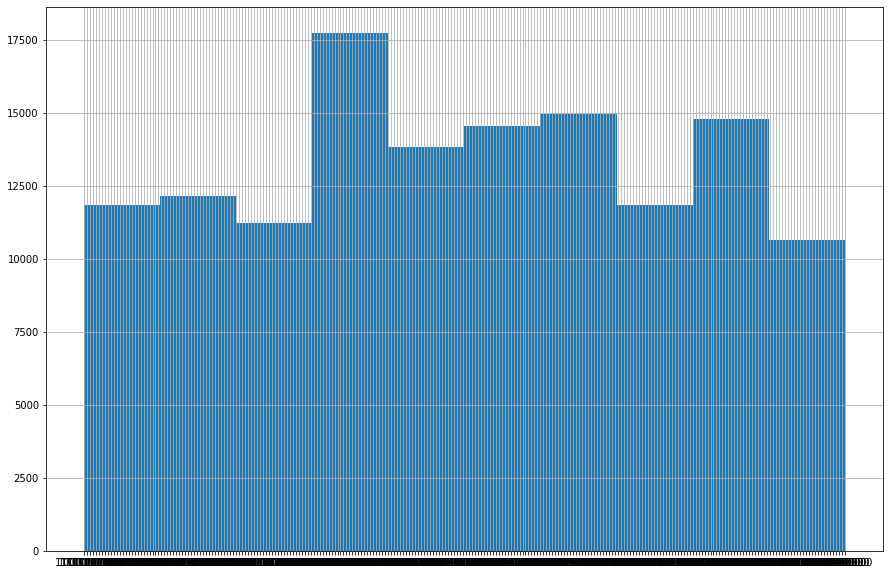

In [47]:
df['coord'].astype(str).hist(figsize=(15,10))

In [48]:
df['coord'] = df['coord'].astype(str)
fig = px.scatter_mapbox(df.dropna(), lat="LATITUDE", lon="LONGITUDE", color='coord',zoom=12)
fig.update_layout(mapbox_style="dark")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [49]:
len(df['coord'].unique())

256

In [46]:
datas = list(all_data.DATAHORA.dt.date.unique())
datas

[datetime.date(2020, 4, 5),
 datetime.date(2020, 4, 6),
 datetime.date(2020, 4, 7),
 datetime.date(2020, 4, 9),
 datetime.date(2020, 4, 10)]

In [49]:
data = datas[-1]
data

datetime.date(2020, 4, 10)

'2020-04-10'